In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle 
import glob
%matplotlib inline 

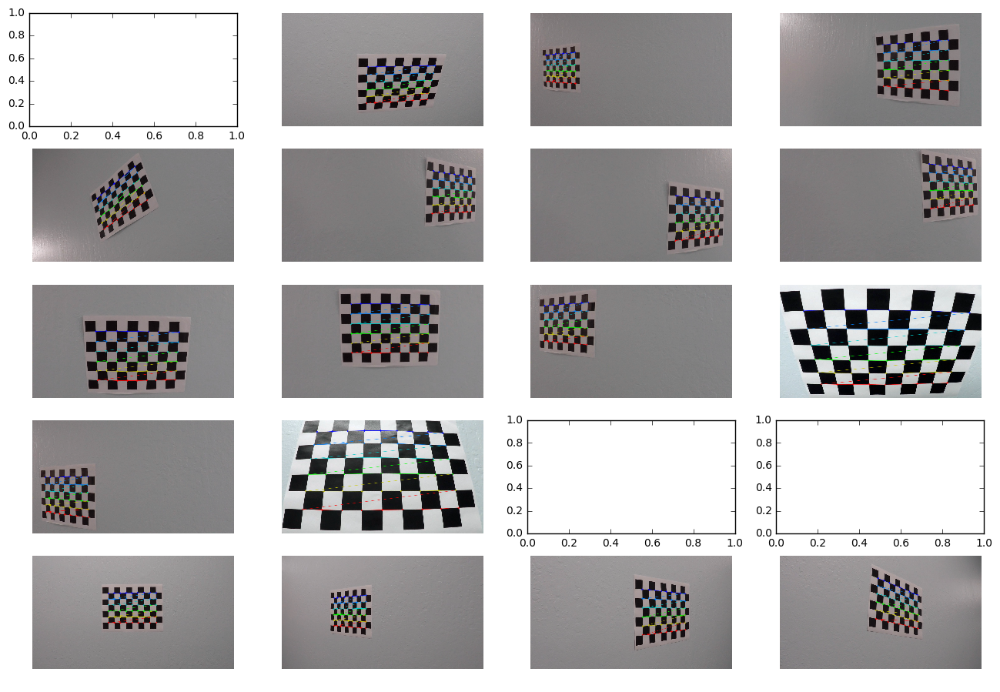

In [2]:
# Returning the list of images of the checkerboards 
img = glob.glob('./camera_cal/calibration*.jpg')

#Object Points for the calibration images
nx = 9
ny = 6
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

fig, axs = plt.subplots(5,4, figsize=(16, 11))
axs = axs.ravel()

#Visualizing the Images
for i, fname in enumerate(img):
    image = cv2.imread(fname)
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        #Loading the data, increasing accuracy cornerSubPix() according to openCV Turorials
        objpoints.append(objp)
        
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)    
        
        #Showing the Boards
        cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(image)

        
    
    

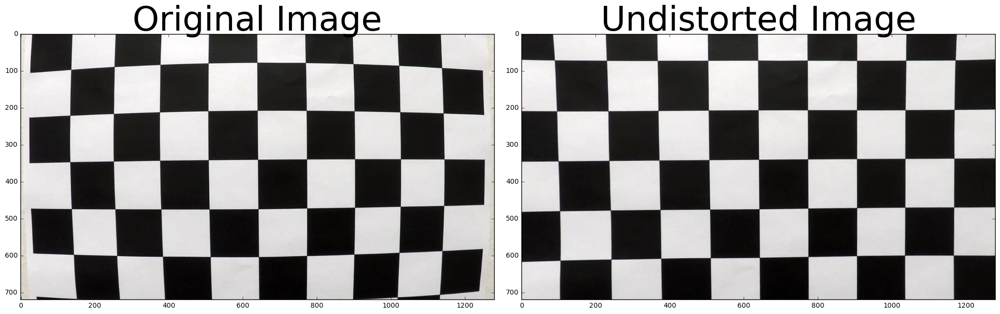

In [3]:
image = mpimg.imread('./camera_cal/calibration1.jpg')
img_size = (gray.shape[1], gray.shape[0])


def undistorted(img, objpoints, imgpoints):  
    
    #Camera Calibration
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    #Undistorting Image
    dst = cv2.undistort(img, mtx, dist, None, mtx)     
    
    return dst

result_image = undistorted(image, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(result_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    




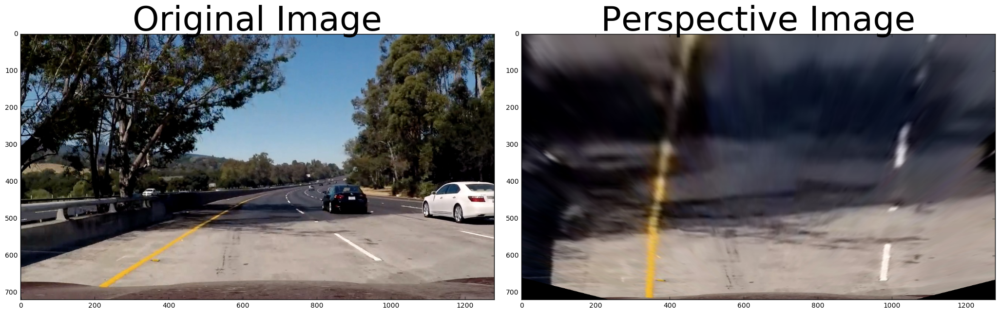

In [85]:
#Test Image for Perspective Transformation
test_image = mpimg.imread('./test_images/test5.jpg')

def perspective(img):
    
    x,y = img.shape[:2]

    # define source and destination points for transform
    src = np.float32([[475,530],
        [830,530],
        [130,720],
        [1120,720]])
    dst = np.float32([[365,540],
        [990,540],
        [320,720],
        [960,720]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    
    return warped, M, Minv

new_test_image = undistorted(test_image, objpoints, imgpoints)
new_test_image, M, Minv = perspective(new_test_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(new_test_image)
ax2.set_title('Perspective Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


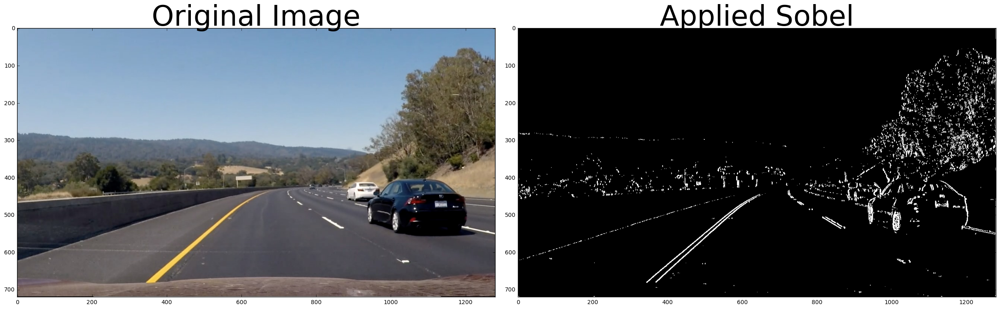

In [121]:
sobel_test_image = mpimg.imread('./test_images/test8.jpg')

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # 3) Take the absolute value of the derivative or gradient
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return binary_output

mag_binary = abs_sobel_thresh(sobel_test_image, orient='x', thresh_min=25, thresh_max=255)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(sobel_test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Applied Sobel', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

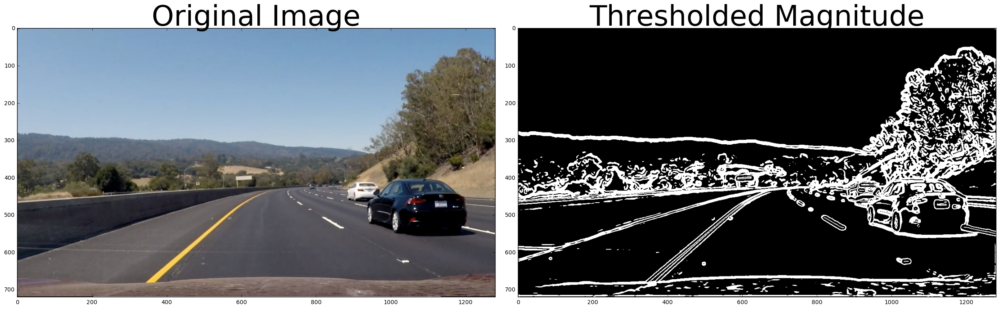

In [123]:
magnitude_test = mpimg.imread('./test_images/test8.jpg')

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    # 6) Return this mask as your binary_output image
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    return binary_output

mag_image = mag_thresh(magnitude_test, sobel_kernel=25, mag_thresh=(20, 100))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(magnitude_test)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_image, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    

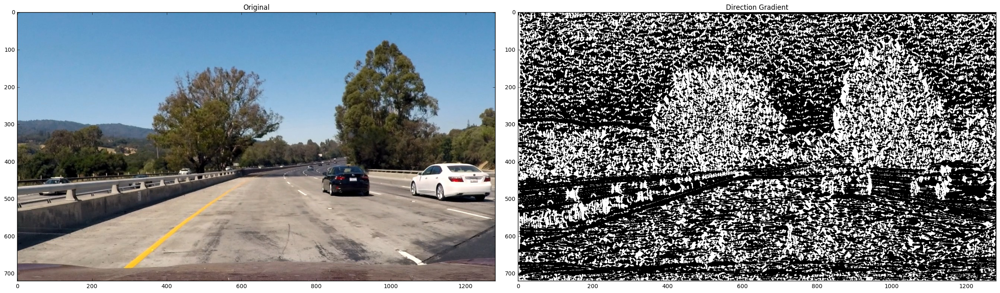

In [100]:
def dir_thresh(img, sobel_kernel = 3, thresh= (0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize= sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize= sobel_kernel)
    
    absgradient = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    binary_output = np.zeros_like(absgradient)
    binary_output[(absgradient >= thresh[0]) & (absgradient <= thresh[1])] = 1
    return binary_output

dir_image = dir_thresh(magnitude_test, sobel_kernel=15, thresh=(0.0, 0.9))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(magnitude_test)
ax1.set_title("Original")
ax2.imshow(dir_image, cmap='gray')
ax2.set_title("Direction Gradient")
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    

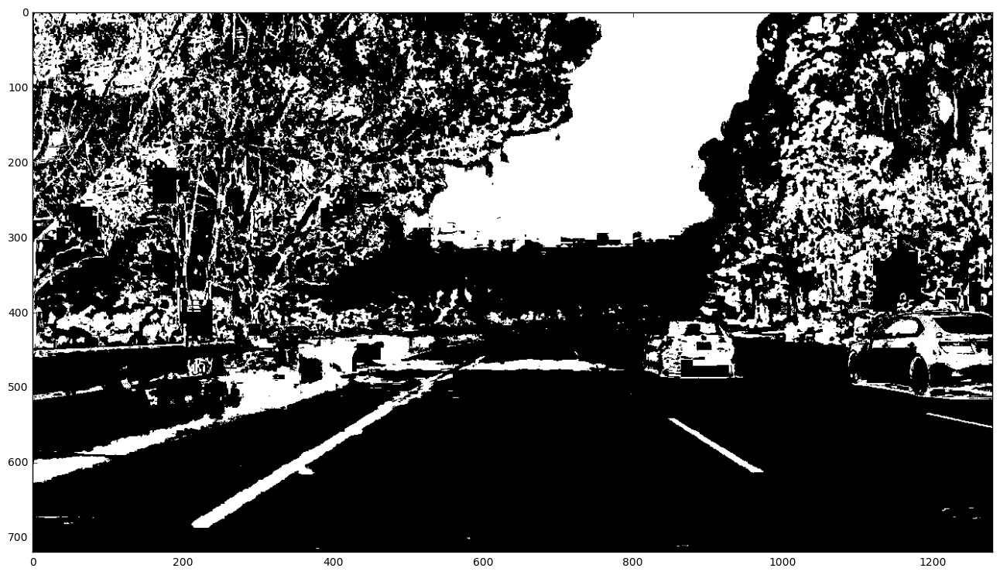

In [117]:
def hls_select(img):
    #Apply threshold
    
    smin_thresh =  90
    smax_thresh = 255
    s_channel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    s_channel = s_channel*(255/np.max(s_channel))
    s_binary = np.zeros_like(s_channel)
    
    s_binary[(s_channel > smin_thresh) & (s_channel <= smax_thresh)] = 1
    
    lmin_thresh = 90
    lmax_thresh = 255
    l_channel = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)[:,:,0]
    l_binary = np.zeros_like(l_channel)
    l_binary[(s_channel > lmin_thresh) & (s_channel <= lmax_thresh)] = 1
    
    bmin_thresh = 190
    bmax_thresh = 255
    b_channel = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)[:,:,2]
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel > bmin_thresh) & (b_channel <= bmax_thresh)] = 1
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(s_binary == 1)] = 1
    
    return combined_binary

color_image = hls_select(magnitude_test)

f, ax1 = plt.subplots(figsize=(24, 9))
ax1.imshow(color_image, cmap = 'gray')


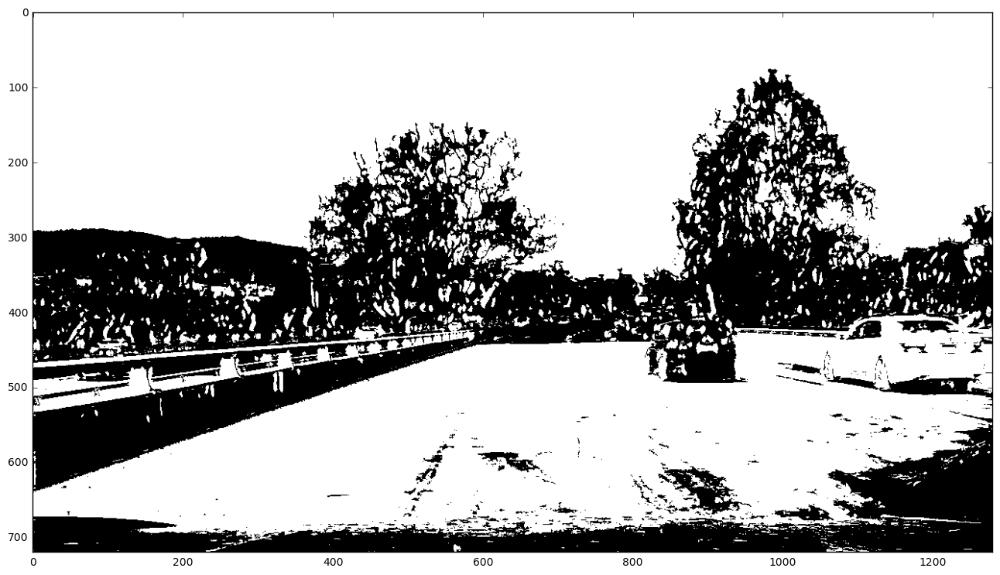

In [105]:
#Combining the Color & Gradient Thresholds together

ksize = 3
def thresholds_add(image):
    
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=40, thresh_max=255)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=40, thresh_max=255)
    magnitude_bin = mag_thresh(image, sobel_kernel= 25, mag_thresh=(25, 255))
    direction_bin = dir_thresh(image, sobel_kernel=15, thresh=(0.0, 0.9))
    color_thresh = hls_select(image)
    
    #Empty Array
    combined_thresholds = np.zeros_like(magnitude_bin)
    
    combined_thresholds[((gradx == 1) & (grady == 1)) | ((magnitude_bin == 1) & (direction_bin == 1)) | (color_thresh == 1)] = 1
    return combined_thresholds
    
combined_image = thresholds_add(magnitude_test)
f, ax1 = plt.subplots(figsize=(24, 9))
ax1.imshow(combined_image, cmap='gray')


In [106]:
ym_per_px = 30 / 720
xm_per_px = 3.7 / 700

#calculate curves
def calculate_curvature(leftx,lefty,rightx,righty):
    left_fit_cr = np.polyfit(lefty * ym_per_px, leftx * xm_per_px, 2)
    right_fit_cr = np.polyfit(righty * ym_per_px, rightx * xm_per_px, 2)

    left_curverad = ((1 + (2 * left_fit_cr[0] * np.max(lefty) + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * np.max(lefty) + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit_cr[0])
    return left_curverad,right_curverad

def get_center_calc(video,left_fitx,right_fitx):
    vehicle_position = video.shape[1] / 2
    center_of_lane = (left_fitx[-1] + right_fitx[-1]) // 2
    center_calc = (vehicle_position - center_of_lane) * xm_per_px
    return center_calc

In [107]:
class Lines:
    cached_result = None
    cached_lane = None
    last_good_right_curve = None
    last_good_left_curve = None

In [108]:
#Adding the visuals for the thresholds and lane finder

def lane_visuals(binary_warped):

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    
     # calculate curvature and centerline
    left_curverad, right_curverad =  calculate_curvature(leftx, lefty, rightx, righty)
    center_calc = get_center_calc(binary_warped,left_fitx,right_fitx)
    

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (binary_warped.shape[1], binary_warped.shape[0]), flags=cv2.INTER_LINEAR) 
    Lines.cached_lane = newwarp
    Lines.last_good_right_curve = right_curverad
    Lines.last_good_left_curve = left_curverad

    
    # Combine the result with the original image
    return newwarp, right_curverad, left_curverad, center_calc
        

In [109]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML


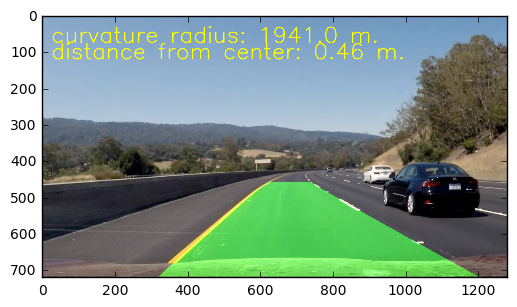

In [124]:
#Creating the pipeline for the thresholds


def pipeline_creation(vid):
    #camera calibration and Distortion correction
    image = undistorted(vid, objpoints, imgpoints)
    
    #Function from combining all the Gradient and Color Thresholds
    image = thresholds_add(image)
    
#     #Perspective Transormation
    image, M, Minv = perspective(image)
    # Visuals
    newwarp, right_curverad, left_curverad, center_calc = lane_visuals(image)
    vid = cv2.addWeighted(vid, 1, newwarp, 0.5, 0)
    Lines.cached_result = vid
    # Text and the measurements
    text = 'curvature radius: {0} m. '.format((int(left_curverad) + int(right_curverad)) / 2 )
    text2 = 'distance from center: {0} m. '.format(( np.math.ceil(abs(center_calc) * 100) / 100))
    cv2.putText(vid,text,(25,75),cv2.FONT_HERSHEY_SIMPLEX,2,(255,255,0),2,cv2.LINE_AA)
    cv2.putText(vid, text2, (25, 120), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 0), 2, cv2.LINE_AA)
    
    return vid
    
    
    

the_test = pipeline_creation(magnitude_test)
plt.imshow(the_test)
plt.show()
    
    
    
    

In [125]:


first_output = 'video_outputs/project_video_output.mp4'
clip1 = VideoFileClip('project_video.mp4')
first_clip = clip1.fl_image(pipeline_creation)
%time first_clip.write_videofile(first_output, audio=False)

[MoviePy] >>>> Building video video_outputs/project_video_output.mp4
[MoviePy] Writing video video_outputs/project_video_output.mp4


100%|█████████▉| 1260/1261 [19:26<00:00,  1.09it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_outputs/project_video_output.mp4 

CPU times: user 26min 11s, sys: 1min 7s, total: 27min 18s
Wall time: 19min 27s


In [126]:

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(first_output))